# Description

Data Source: https://www.kaggle.com/datasets/mateuszbuda/lgg-mri-segmentation

## 1. First check if the GPU is available and running

In [1]:
import tensorflow as tf

# Check TensorFlow version
print("TensorFlow Version:", tf.__version__)

# List available devices, filter for GPU devices
gpus = tf.config.list_physical_devices('GPU')
if gpus:
    for gpu in gpus:
        print("GPU Available:", gpu)
else:
    print("No GPU found")

TensorFlow Version: 2.10.1
GPU Available: PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')


## 2. Import Libraries

In [2]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import zipfile
import cv2
from skimage import io
import tensorflow as tf
from tensorflow.python.keras import Sequential
from tensorflow.keras import layers, optimizers
from tensorflow.keras.applications import DenseNet121
from tensorflow.keras.applications.resnet50 import ResNet50
from tensorflow.keras.layers import *
from tensorflow.keras.models import Model, load_model
from tensorflow.keras.initializers import glorot_uniform
from tensorflow.keras.utils import plot_model
from tensorflow.keras.callbacks import ReduceLROnPlateau, EarlyStopping, ModelCheckpoint, LearningRateScheduler
from IPython.display import display
from tensorflow.keras import backend as K
from sklearn.preprocessing import StandardScaler, normalize
import os
import glob
import random
%matplotlib inline

## 3. Import Dataset

#### 3.1 import the data

In [3]:
brain_df = pd.read_csv('./Healthcare AI Datasets/Brain_MRI/data_mask.csv')

#### 3.2 Explore the data

In [4]:
brain_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3929 entries, 0 to 3928
Data columns (total 4 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   patient_id  3929 non-null   object
 1   image_path  3929 non-null   object
 2   mask_path   3929 non-null   object
 3   mask        3929 non-null   int64 
dtypes: int64(1), object(3)
memory usage: 122.9+ KB


In [5]:
brain_df.head(50)

,patient_id,image_path,mask_path,mask
0,TCGA_CS_5395_19981004,TCGA_CS_5395_19981004/TCGA_CS_5395_19981004_1.tif,TCGA_CS_5395_19981004/TCGA_CS_5395_19981004_1_...,0
1,TCGA_CS_5395_19981004,TCGA_CS_4944_20010208/TCGA_CS_4944_20010208_1.tif,TCGA_CS_4944_20010208/TCGA_CS_4944_20010208_1_...,0
2,TCGA_CS_5395_19981004,TCGA_CS_4941_19960909/TCGA_CS_4941_19960909_1.tif,TCGA_CS_4941_19960909/TCGA_CS_4941_19960909_1_...,0
3,TCGA_CS_5395_19981004,TCGA_CS_4943_20000902/TCGA_CS_4943_20000902_1.tif,TCGA_CS_4943_20000902/TCGA_CS_4943_20000902_1_...,0
4,TCGA_CS_5395_19981004,TCGA_CS_5396_20010302/TCGA_CS_5396_20010302_1.tif,TCGA_CS_5396_20010302/TCGA_CS_5396_20010302_1_...,0
5,TCGA_CS_5395_19981004,TCGA_CS_5393_19990606/TCGA_CS_5393_19990606_1.tif,TCGA_CS_5393_19990606/TCGA_CS_5393_19990606_1_...,0
6,TCGA_CS_5395_19981004,TCGA_CS_4942_19970222/TCGA_CS_4942_19970222_1.tif,TCGA_CS_4942_19970222/TCGA_CS_4942_19970222_1_...,0
7,TCGA_CS_5395_19981004,TCGA_CS_5397_20010315/TCGA_CS_5397_20010315_1.tif,TCGA_CS_5397_20010315/TCGA_CS_5397_20010315_1_...,0
8,TCGA_CS_5395_19981004,TCGA_CS_6188_20010812/TCGA_CS_6188_20010812_1.tif,TCGA_CS_6188_20010812/TCGA_CS_6188_20010812_1_...,0
9,TCGA_CS_5395_19981004,TCGA_CS_6666_20011109/TCGA_CS_6666_20011109_1.tif,TCGA_CS_6666_20011109/TCGA_CS_6666_20011109_1_...,0


In [6]:
brain_df.mask_path[1] # Path to the brain MRI image

'TCGA_CS_4944_20010208/TCGA_CS_4944_20010208_1_mask.tif'

In [7]:
brain_df.image_path[1] # Path to the segmentation mask

'TCGA_CS_4944_20010208/TCGA_CS_4944_20010208_1.tif'

Basically segmentation mask is the same as the MRI image resolution. However, it is represented with black and white pixels only. The white pixels represents the correspondent tumor pixels.

#### 3.3 Get count of images that have tumar and images that don't have tumor

In [8]:
brain_df['mask'].value_counts()

mask
0    2556
1    1373
Name: count, dtype: int64

There are 1373 images with brain tumor and 2556 images with no brain tumor. This means we have an unbalanced dataset.

## 4.Data visualization 

#### 4.1 Get info about data

In [9]:
brain_df

,patient_id,image_path,mask_path,mask
0,TCGA_CS_5395_19981004,TCGA_CS_5395_19981004/TCGA_CS_5395_19981004_1.tif,TCGA_CS_5395_19981004/TCGA_CS_5395_19981004_1_...,0
1,TCGA_CS_5395_19981004,TCGA_CS_4944_20010208/TCGA_CS_4944_20010208_1.tif,TCGA_CS_4944_20010208/TCGA_CS_4944_20010208_1_...,0
2,TCGA_CS_5395_19981004,TCGA_CS_4941_19960909/TCGA_CS_4941_19960909_1.tif,TCGA_CS_4941_19960909/TCGA_CS_4941_19960909_1_...,0
3,TCGA_CS_5395_19981004,TCGA_CS_4943_20000902/TCGA_CS_4943_20000902_1.tif,TCGA_CS_4943_20000902/TCGA_CS_4943_20000902_1_...,0
4,TCGA_CS_5395_19981004,TCGA_CS_5396_20010302/TCGA_CS_5396_20010302_1.tif,TCGA_CS_5396_20010302/TCGA_CS_5396_20010302_1_...,0
...,...,...,...,...
3924,TCGA_DU_6401_19831001,TCGA_HT_A61B_19991127/TCGA_HT_A61B_19991127_86...,TCGA_HT_A61B_19991127/TCGA_HT_A61B_19991127_86...,0
3925,TCGA_DU_6401_19831001,TCGA_HT_A61A_20000127/TCGA_HT_A61A_20000127_87...,TCGA_HT_A61A_20000127/TCGA_HT_A61A_20000127_87...,0
3926,TCGA_DU_6401_19831001,TCGA_HT_A61B_19991127/TCGA_HT_A61B_19991127_87...,TCGA_HT_A61B_19991127/TCGA_HT_A61B_19991127_87...,0
3927,TCGA_DU_6401_19831001,TCGA_HT_A61A_20000127/TCGA_HT_A61A_20000127_88...,TCGA_HT_A61A_20000127/TCGA_HT_A61A_20000127_88...,0


In [10]:
brain_df['mask'].value_counts().index

Index([0, 1], dtype='int64', name='mask')

#### 4.2 Plot an interactive bar chart using plotly

In [11]:
import plotly.graph_objects as go

fig = go.Figure([go.Bar(x = brain_df['mask'].value_counts().index, y = brain_df['mask'].value_counts())])
fig.update_traces(marker_color = 'rgb(0,200,0)', marker_line_color = 'rgb(0,255,0)',
                  marker_line_width = 7, opacity = 0.6)
fig.show()

#### 4.3 Data paths

We have to correct the path as the dataset is contained in folders

In [12]:
brain_df.mask_path


0       TCGA_CS_5395_19981004/TCGA_CS_5395_19981004_1_...
1       TCGA_CS_4944_20010208/TCGA_CS_4944_20010208_1_...
2       TCGA_CS_4941_19960909/TCGA_CS_4941_19960909_1_...
3       TCGA_CS_4943_20000902/TCGA_CS_4943_20000902_1_...
4       TCGA_CS_5396_20010302/TCGA_CS_5396_20010302_1_...
                              ...                        
3924    TCGA_HT_A61B_19991127/TCGA_HT_A61B_19991127_86...
3925    TCGA_HT_A61A_20000127/TCGA_HT_A61A_20000127_87...
3926    TCGA_HT_A61B_19991127/TCGA_HT_A61B_19991127_87...
3927    TCGA_HT_A61A_20000127/TCGA_HT_A61A_20000127_88...
3928    TCGA_HT_A61B_19991127/TCGA_HT_A61B_19991127_88...
Name: mask_path, Length: 3929, dtype: object

In [13]:
brain_df.image_path

0       TCGA_CS_5395_19981004/TCGA_CS_5395_19981004_1.tif
1       TCGA_CS_4944_20010208/TCGA_CS_4944_20010208_1.tif
2       TCGA_CS_4941_19960909/TCGA_CS_4941_19960909_1.tif
3       TCGA_CS_4943_20000902/TCGA_CS_4943_20000902_1.tif
4       TCGA_CS_5396_20010302/TCGA_CS_5396_20010302_1.tif
                              ...                        
3924    TCGA_HT_A61B_19991127/TCGA_HT_A61B_19991127_86...
3925    TCGA_HT_A61A_20000127/TCGA_HT_A61A_20000127_87...
3926    TCGA_HT_A61B_19991127/TCGA_HT_A61B_19991127_87...
3927    TCGA_HT_A61A_20000127/TCGA_HT_A61A_20000127_88...
3928    TCGA_HT_A61B_19991127/TCGA_HT_A61B_19991127_88...
Name: image_path, Length: 3929, dtype: object

In [14]:
data_path = "./Healthcare AI Datasets/Brain_MRI/"

#### 4.4 Show MRI and Mask separately

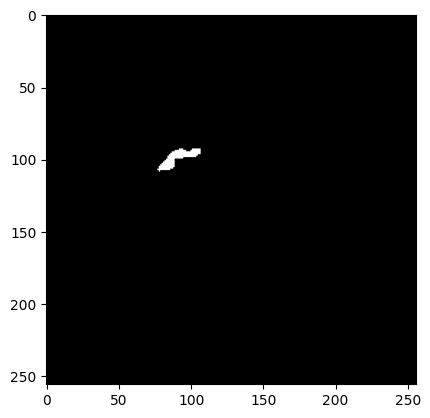

In [15]:
plt.imshow(cv2.imread(data_path+brain_df.mask_path[623]))

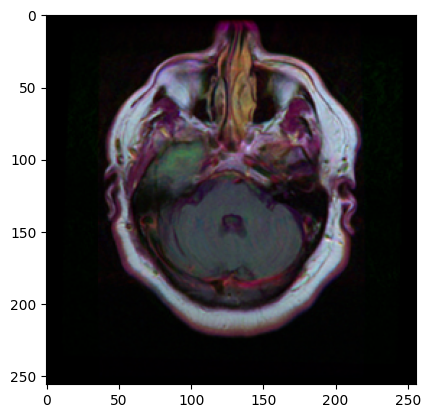

In [16]:
plt.imshow(cv2.imread(data_path + brain_df.image_path[623]))

#### 4.5 Show random MRI and their Mask path.

On the mask image 1 represents a presence of tumor and 0 represents no tumor.

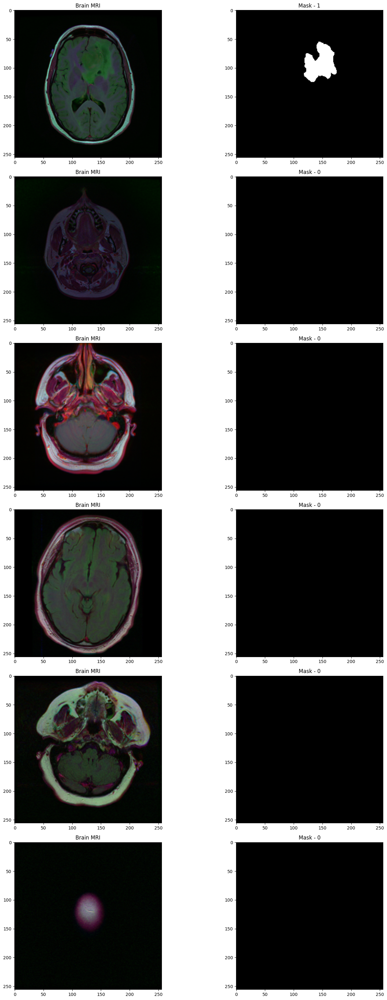

In [17]:
import random
fig, axs = plt.subplots(6,2, figsize=(16,32))
count = 0
for x in range(6):
  i = random.randint(0, len(brain_df)) # select a random index
  axs[count][0].title.set_text("Brain MRI") # set title
  axs[count][0].imshow(cv2.imread(data_path + brain_df.image_path[i])) # show MRI 
  axs[count][1].title.set_text("Mask - " + str(brain_df['mask'][i])) # plot title on the mask (0 or 1)
  axs[count][1].imshow(cv2.imread(data_path + brain_df.mask_path[i])) # Show corresponding mask
  count += 1

fig.tight_layout()
plt.show()

#### 4.6 Show MRI and their Mask with only tumor detected (sick patients). 

We also plot the MRI with Mask on top in red color

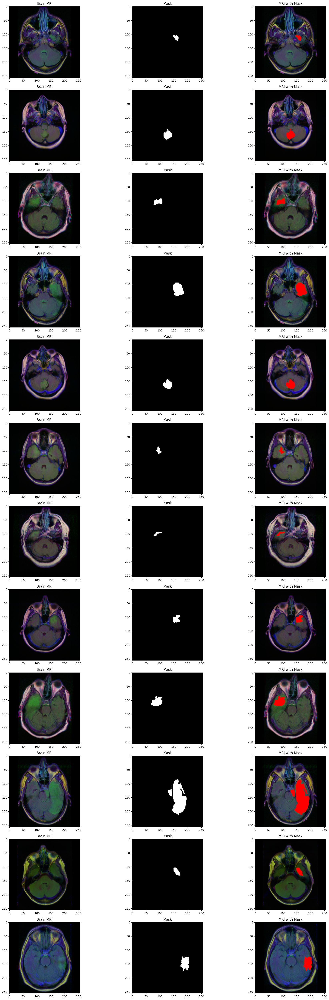

In [18]:
count = 0
fig, axs = plt.subplots(12, 3, figsize = (20, 50))
for i in range(len(brain_df)):
  if brain_df['mask'][i] ==1 and count <12:
    img = io.imread(data_path + brain_df.image_path[i])
    axs[count][0].title.set_text('Brain MRI')
    axs[count][0].imshow(img)

    mask = io.imread(data_path + brain_df.mask_path[i])
    axs[count][1].title.set_text('Mask')
    axs[count][1].imshow(mask, cmap = 'gray')

    
    img[mask == 255] = (255, 0, 0)
    axs[count][2].title.set_text('MRI with Mask')
    axs[count][2].imshow(img)
    count+=1

fig.tight_layout()

## 5. Build a classifier model
This is the first of the 2 models in this project. It is a classifier model that will be used to detect if tumor exists or not. It will use ResNet-50 architecture trained on imagenet dataset.

#### 5.1 Clean data

In [19]:
# Drop the patient id column since we won't need it.
brain_df_train = brain_df.drop(columns = ['patient_id'])
brain_df_train.shape

(3929, 3)

In [20]:
# Convert the data in mask column to string format, to use categorical mode in flow_from_dataframe
# You will get this error message if you comment out the following code line:
# TypeError: If class_mode="categorical", y_col="mask" column values must be type string, list or tuple.
brain_df_train['mask'] = brain_df_train['mask'].apply(lambda x: str(x))

In [21]:
brain_df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3929 entries, 0 to 3928
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   image_path  3929 non-null   object
 1   mask_path   3929 non-null   object
 2   mask        3929 non-null   object
dtypes: object(3)
memory usage: 92.2+ KB


#### 5.2 Split data into testing and training

We will use 85% of the data for training

In [22]:
from sklearn.model_selection import train_test_split

train, test = train_test_split(brain_df_train, test_size = 0.15)

#### 5.3 Image generator

Validation split will allow model to generalize. We use the cross validation on training and testing data. They must both be going down. If training loss is but testing loss is not, we need to stop training since the model is trying to just memorize the dataset which we must avoid.

In [23]:
# create a image generator
from keras_preprocessing.image import ImageDataGenerator

# Create a data generator in batch format which scales the data from 0 to 1 and makes validation split of 0.15
datagen = ImageDataGenerator(rescale=1./255., validation_split = 0.15)

In [24]:
data_path = "./Healthcare AI Datasets/Brain_MRI/"

train_generator=datagen.flow_from_dataframe(
dataframe=train,
directory= data_path,
x_col='image_path',
y_col='mask',
subset="training",
batch_size=16,
shuffle=True, #ensure the model doesn't learn the order of images
class_mode="categorical",
target_size=(256,256))


valid_generator=datagen.flow_from_dataframe(
dataframe=train,
directory= data_path,
x_col='image_path',
y_col='mask',
subset="validation",
batch_size=16,
shuffle=True,
class_mode="categorical",
target_size=(256,256))

# Create a data generator for test images
test_datagen=ImageDataGenerator(rescale=1./255.)

test_generator=test_datagen.flow_from_dataframe(
dataframe=test,
directory= data_path,
x_col='image_path',
y_col='mask',
batch_size=16,
shuffle=False,
class_mode='categorical',
target_size=(256,256))



Found 2839 validated image filenames belonging to 2 classes.
Found 500 validated image filenames belonging to 2 classes.
Found 590 validated image filenames belonging to 2 classes.


Above we can see 2839 images for testing, 500 images for testing, 590 images for validation

#### 5.4 Import ResNet-50 trained on imagenet dataset
The imports are described in # 2. 

Basically we are using a pretrained model of resnet50 model on image net. This is known as transfer learning which can significantly reduce the training time as the weights are alread established and not completely random. We can use this and tune it to our project specifically.

In [25]:
# Include_top must be false as we will use our own dense layer
basemodel = ResNet50(weights = 'imagenet', include_top = False, input_tensor = Input(shape=(256, 256, 3)))

In [26]:
basemodel.summary()

Model: "resnet50"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 262, 262, 3)  0           ['input_1[0][0]']                
                                                                                                  
 conv1_conv (Conv2D)            (None, 128, 128, 64  9472        ['conv1_pad[0][0]']              
                                )                                                                 
                                                                                           

                                                                                                  
 conv2_block3_1_relu (Activatio  (None, 64, 64, 64)  0           ['conv2_block3_1_bn[0][0]']      
 n)                                                                                               
                                                                                                  
 conv2_block3_2_conv (Conv2D)   (None, 64, 64, 64)   36928       ['conv2_block3_1_relu[0][0]']    
                                                                                                  
 conv2_block3_2_bn (BatchNormal  (None, 64, 64, 64)  256         ['conv2_block3_2_conv[0][0]']    
 ization)                                                                                         
                                                                                                  
 conv2_block3_2_relu (Activatio  (None, 64, 64, 64)  0           ['conv2_block3_2_bn[0][0]']      
 n)       

                                                                                                  
 conv3_block3_1_relu (Activatio  (None, 32, 32, 128)  0          ['conv3_block3_1_bn[0][0]']      
 n)                                                                                               
                                                                                                  
 conv3_block3_2_conv (Conv2D)   (None, 32, 32, 128)  147584      ['conv3_block3_1_relu[0][0]']    
                                                                                                  
 conv3_block3_2_bn (BatchNormal  (None, 32, 32, 128)  512        ['conv3_block3_2_conv[0][0]']    
 ization)                                                                                         
                                                                                                  
 conv3_block3_2_relu (Activatio  (None, 32, 32, 128)  0          ['conv3_block3_2_bn[0][0]']      
 n)       

                                                                                                  
 conv4_block2_1_bn (BatchNormal  (None, 16, 16, 256)  1024       ['conv4_block2_1_conv[0][0]']    
 ization)                                                                                         
                                                                                                  
 conv4_block2_1_relu (Activatio  (None, 16, 16, 256)  0          ['conv4_block2_1_bn[0][0]']      
 n)                                                                                               
                                                                                                  
 conv4_block2_2_conv (Conv2D)   (None, 16, 16, 256)  590080      ['conv4_block2_1_relu[0][0]']    
                                                                                                  
 conv4_block2_2_bn (BatchNormal  (None, 16, 16, 256)  1024       ['conv4_block2_2_conv[0][0]']    
 ization) 

 conv4_block5_1_conv (Conv2D)   (None, 16, 16, 256)  262400      ['conv4_block4_out[0][0]']       
                                                                                                  
 conv4_block5_1_bn (BatchNormal  (None, 16, 16, 256)  1024       ['conv4_block5_1_conv[0][0]']    
 ization)                                                                                         
                                                                                                  
 conv4_block5_1_relu (Activatio  (None, 16, 16, 256)  0          ['conv4_block5_1_bn[0][0]']      
 n)                                                                                               
                                                                                                  
 conv4_block5_2_conv (Conv2D)   (None, 16, 16, 256)  590080      ['conv4_block5_1_relu[0][0]']    
                                                                                                  
 conv4_blo

                                                                  'conv5_block1_3_bn[0][0]']      
                                                                                                  
 conv5_block1_out (Activation)  (None, 8, 8, 2048)   0           ['conv5_block1_add[0][0]']       
                                                                                                  
 conv5_block2_1_conv (Conv2D)   (None, 8, 8, 512)    1049088     ['conv5_block1_out[0][0]']       
                                                                                                  
 conv5_block2_1_bn (BatchNormal  (None, 8, 8, 512)   2048        ['conv5_block2_1_conv[0][0]']    
 ization)                                                                                         
                                                                                                  
 conv5_block2_1_relu (Activatio  (None, 8, 8, 512)   0           ['conv5_block2_1_bn[0][0]']      
 n)       

#### 5.5 Tailor the model to our own needs.

We won't touch the weights.
However we will define the classification head to the base model.

In [27]:
# freeze the model weights

for layer in basemodel.layers:
  layers.trainable = False

In [28]:
# Add classification head to the base model

headmodel = basemodel.output
headmodel = AveragePooling2D(pool_size = (4,4))(headmodel)
headmodel = Flatten(name= 'flatten')(headmodel)
headmodel = Dense(256, activation = "relu")(headmodel)
headmodel = Dropout(0.3)(headmodel)#
headmodel = Dense(256, activation = "relu")(headmodel)
headmodel = Dropout(0.3)(headmodel)
#headmodel = Dense(256, activation = "relu")(headmodel)
#headmodel = Dropout(0.3)(headmodel)
headmodel = Dense(2, activation = 'softmax')(headmodel)

model = Model(inputs = basemodel.input, outputs = headmodel)

In [29]:
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 262, 262, 3)  0           ['input_1[0][0]']                
                                                                                                  
 conv1_conv (Conv2D)            (None, 128, 128, 64  9472        ['conv1_pad[0][0]']              
                                )                                                                 
                                                                                              

                                                                                                  
 conv2_block3_1_relu (Activatio  (None, 64, 64, 64)  0           ['conv2_block3_1_bn[0][0]']      
 n)                                                                                               
                                                                                                  
 conv2_block3_2_conv (Conv2D)   (None, 64, 64, 64)   36928       ['conv2_block3_1_relu[0][0]']    
                                                                                                  
 conv2_block3_2_bn (BatchNormal  (None, 64, 64, 64)  256         ['conv2_block3_2_conv[0][0]']    
 ization)                                                                                         
                                                                                                  
 conv2_block3_2_relu (Activatio  (None, 64, 64, 64)  0           ['conv2_block3_2_bn[0][0]']      
 n)       

                                                                                                  
 conv3_block3_1_relu (Activatio  (None, 32, 32, 128)  0          ['conv3_block3_1_bn[0][0]']      
 n)                                                                                               
                                                                                                  
 conv3_block3_2_conv (Conv2D)   (None, 32, 32, 128)  147584      ['conv3_block3_1_relu[0][0]']    
                                                                                                  
 conv3_block3_2_bn (BatchNormal  (None, 32, 32, 128)  512        ['conv3_block3_2_conv[0][0]']    
 ization)                                                                                         
                                                                                                  
 conv3_block3_2_relu (Activatio  (None, 32, 32, 128)  0          ['conv3_block3_2_bn[0][0]']      
 n)       

                                                                                                  
 conv4_block2_1_bn (BatchNormal  (None, 16, 16, 256)  1024       ['conv4_block2_1_conv[0][0]']    
 ization)                                                                                         
                                                                                                  
 conv4_block2_1_relu (Activatio  (None, 16, 16, 256)  0          ['conv4_block2_1_bn[0][0]']      
 n)                                                                                               
                                                                                                  
 conv4_block2_2_conv (Conv2D)   (None, 16, 16, 256)  590080      ['conv4_block2_1_relu[0][0]']    
                                                                                                  
 conv4_block2_2_bn (BatchNormal  (None, 16, 16, 256)  1024       ['conv4_block2_2_conv[0][0]']    
 ization) 

 conv4_block5_1_conv (Conv2D)   (None, 16, 16, 256)  262400      ['conv4_block4_out[0][0]']       
                                                                                                  
 conv4_block5_1_bn (BatchNormal  (None, 16, 16, 256)  1024       ['conv4_block5_1_conv[0][0]']    
 ization)                                                                                         
                                                                                                  
 conv4_block5_1_relu (Activatio  (None, 16, 16, 256)  0          ['conv4_block5_1_bn[0][0]']      
 n)                                                                                               
                                                                                                  
 conv4_block5_2_conv (Conv2D)   (None, 16, 16, 256)  590080      ['conv4_block5_1_relu[0][0]']    
                                                                                                  
 conv4_blo

                                                                  'conv5_block1_3_bn[0][0]']      
                                                                                                  
 conv5_block1_out (Activation)  (None, 8, 8, 2048)   0           ['conv5_block1_add[0][0]']       
                                                                                                  
 conv5_block2_1_conv (Conv2D)   (None, 8, 8, 512)    1049088     ['conv5_block1_out[0][0]']       
                                                                                                  
 conv5_block2_1_bn (BatchNormal  (None, 8, 8, 512)   2048        ['conv5_block2_1_conv[0][0]']    
 ization)                                                                                         
                                                                                                  
 conv5_block2_1_relu (Activatio  (None, 8, 8, 512)   0           ['conv5_block2_1_bn[0][0]']      
 n)       

## 6. Train the model

#### 6.1 Compile the model

In [ ]:
model.compile(loss = 'categorical_crossentropy', optimizer='adam', metrics= ["accuracy"])

#### 6.2 Save the best model

In [ ]:
# use early stopping to exit training if validation loss is not decreasing even after certain epochs (patience)
earlystopping = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=20)

# save the best model with least validation loss
checkpointer = ModelCheckpoint(filepath="./Healthcare AI Datasets/classifier-resnet-weights.hdf5", verbose=1, save_best_only=True)

#### 6.3 Train the model

In [ ]:
history = model.fit(train_generator, steps_per_epoch= train_generator.n // 16, epochs = 10, validation_data= valid_generator, validation_steps= valid_generator.n // 16, callbacks=[checkpointer, earlystopping])

#### 6.4 Save the model's architecture

In [ ]:
# save the model architecture to json file for future use

model_json = model.to_json()
with open("./Healthcare AI Datasets/classifier-resnet-model.json","w") as json_file:
  json_file.write(model_json)

## 7 . Assess the model's performance

#### 7.1 Load the model

In [30]:
with open('./Healthcare AI Datasets/classifier-resnet-model.json', 'r') as json_file:
    json_savedModel= json_file.read()

model = tf.keras.models.model_from_json(json_savedModel)
model.load_weights('./Healthcare AI Datasets/classifier-resnet-weights.hdf5')
model.compile(loss = 'categorical_crossentropy', optimizer='adam', metrics= ["accuracy"])

#### 7.2 Make the predictions on the tests

In [31]:
# make prediction
test_predict = model.predict(test_generator, steps = test_generator.n // 16, verbose =1)

36/36 [==============================] - 3s 16ms/step


In [32]:
test_predict.shape

(576, 2)

In [33]:
test_predict

array([[1.0000000e+00, 7.9984641e-09],
       [1.0000000e+00, 5.3198401e-24],
       [5.4292489e-08, 1.0000000e+00],
       ...,
       [1.2961194e-04, 9.9987042e-01],
       [9.8577601e-01, 1.4223922e-02],
       [2.5356454e-03, 9.9746430e-01]], dtype=float32)

In [34]:
# Obtain the predicted class from the model prediction
predict = []

for i in test_predict:
  predict.append(str(np.argmax(i)))

predict = np.asarray(predict)

In [35]:
predict

array(['0', '0', '1', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0',
       '0', '0', '0', '0', '0', '0', '0', '0', '1', '1', '1', '0', '1',
       '0', '1', '0', '0', '0', '0', '0', '0', '1', '1', '0', '0', '0',
       '0', '0', '0', '0', '0', '0', '0', '0', '1', '0', '1', '0', '0',
       '1', '0', '0', '1', '0', '0', '1', '0', '1', '1', '0', '1', '0',
       '0', '0', '0', '1', '1', '0', '0', '0', '0', '0', '1', '1', '0',
       '1', '0', '0', '0', '1', '0', '0', '0', '0', '1', '0', '0', '0',
       '0', '0', '0', '0', '1', '0', '0', '0', '0', '0', '0', '0', '0',
       '1', '1', '0', '0', '1', '1', '0', '0', '1', '1', '1', '0', '0',
       '0', '1', '1', '0', '0', '0', '0', '1', '0', '1', '1', '0', '1',
       '0', '0', '0', '0', '1', '1', '1', '1', '0', '0', '1', '0', '0',
       '1', '1', '1', '0', '0', '0', '1', '0', '0', '0', '0', '0', '1',
       '1', '1', '0', '0', '0', '0', '0', '1', '1', '0', '0', '1', '1',
       '0', '0', '0', '1', '1', '1', '1', '0', '0', '1', '1', '0

In [36]:
# since we have used test generator, it limited the images to len(predict), due to batch size
original = np.asarray(test['mask'])[:len(predict)]
len(original)

576

#### 7.3 Get the accuracy of the model

In [37]:
from sklearn.metrics import accuracy_score

accuracy = accuracy_score(original, predict)
accuracy

0.9774305555555556

#### 7.4 Plot the confusion matrix

<Axes: >

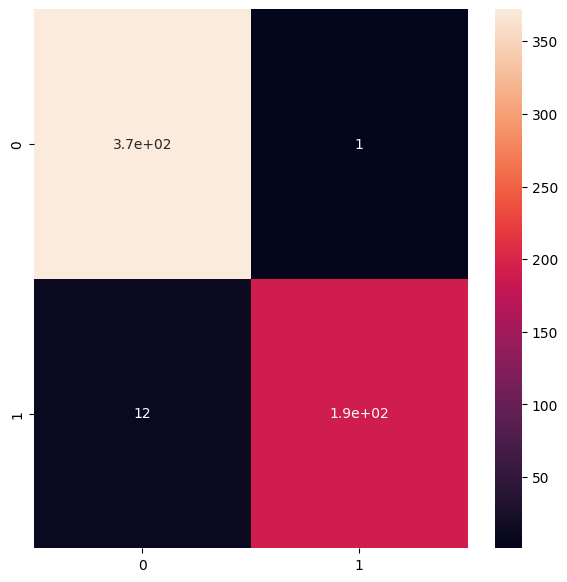

In [38]:
from sklearn.metrics import confusion_matrix

cm = confusion_matrix(original, predict)
plt.figure(figsize = (7,7))
sns.heatmap(cm, annot=True)

#### 7.5 Generate a report (Summary for the model)

In [39]:
from sklearn.metrics import classification_report

report = classification_report(original, predict, labels = [0,1])
print(report)

              precision    recall  f1-score   support

           0       0.97      1.00      0.98       373
           1       0.99      0.94      0.97       203

   micro avg       0.98      0.98      0.98       576
   macro avg       0.98      0.97      0.97       576
weighted avg       0.98      0.98      0.98       576



## 8. Build a segmentation model
This is the second of the 2 models in this project. It is a segmentation model that will be used to localize tumor if they exist. It will use the resunet architecture.

#### 8.1 Get the dataframe where mask shows a tumor

In [40]:
brain_df_mask = brain_df[brain_df['mask'] == 1]
brain_df_mask.shape

(1373, 4)

#### 8.2 Split the data into training and testing data

In [41]:
from sklearn.model_selection import train_test_split

X_train, X_val = train_test_split(brain_df_mask, test_size=0.15)
X_test, X_val = train_test_split(X_val, test_size=0.5)

#### 8.3 Create a separe list for imageId, classId to pass it to the generator

In [42]:
train_ids = list(X_train.image_path)
train_mask = list(X_train.mask_path)

val_ids = list(X_val.image_path)
val_mask= list(X_val.mask_path)

#### 8.4 A custom loss function is used

It was researched back in 2018 https://arxiv.org/abs/1810.07842

A PDF by the author can be downloaded here: https://www.nabilaabraham.com/files/0542.pdf

A repository was provided: https://github.com/nabsabraham/focal-tversky-unet/blob/master/losses.py

In [97]:
# Utilities file contains the code for custom loss function and custom data generator
from utilities import DataGenerator

# create image generators
training_generator = DataGenerator(train_ids,train_mask)
validation_generator = DataGenerator(val_ids,val_mask)

#### 8.5 Define the resblock

In [98]:
def resblock(X, f):
  

  # make a copy of input
  X_copy = X

  # main path
  # Read more about he_normal: https://medium.com/@prateekvishnu/xavier-and-he-normal-he-et-al-initialization-8e3d7a087528

  X = Conv2D(f, kernel_size = (1,1) ,strides = (1,1),kernel_initializer ='he_normal')(X)
  X = BatchNormalization()(X)
  X = Activation('relu')(X) 

  X = Conv2D(f, kernel_size = (3,3), strides =(1,1), padding = 'same', kernel_initializer ='he_normal')(X)
  X = BatchNormalization()(X)

  # Short path
  # Read more here: https://towardsdatascience.com/understanding-and-coding-a-resnet-in-keras-446d7ff84d33

  X_copy = Conv2D(f, kernel_size = (1,1), strides =(1,1), kernel_initializer ='he_normal')(X_copy)
  X_copy = BatchNormalization()(X_copy)

  # Adding the output from main path and short path together

  X = Add()([X,X_copy])
  X = Activation('relu')(X)

  return X

#### 8.6 Define function to upscale and concatenate the values

In [99]:
# function to upscale and concatenate the values passsed
def upsample_concat(x, skip):
  x = UpSampling2D((2,2))(x)
  merge = Concatenate()([x, skip])

  return merge

#### 8.7 Design the main architecture of the model

In [100]:
input_shape = (256,256,3)

# Input tensor shape
X_input = Input(input_shape)

# Stage 1
conv1_in = Conv2D(16,3,activation= 'relu', padding = 'same', kernel_initializer ='he_normal')(X_input)
conv1_in = BatchNormalization()(conv1_in)
conv1_in = Conv2D(16,3,activation= 'relu', padding = 'same', kernel_initializer ='he_normal')(conv1_in)
conv1_in = BatchNormalization()(conv1_in)
pool_1 = MaxPool2D(pool_size = (2,2))(conv1_in)

# Stage 2
conv2_in = resblock(pool_1, 32)
pool_2 = MaxPool2D(pool_size = (2,2))(conv2_in)

# Stage 3
conv3_in = resblock(pool_2, 64)
pool_3 = MaxPool2D(pool_size = (2,2))(conv3_in)

# Stage 4
conv4_in = resblock(pool_3, 128)
pool_4 = MaxPool2D(pool_size = (2,2))(conv4_in)

# Stage 5 (Bottle Neck)
conv5_in = resblock(pool_4, 256)

# Upscale stage 1
up_1 = upsample_concat(conv5_in, conv4_in)
up_1 = resblock(up_1, 128)

# Upscale stage 2
up_2 = upsample_concat(up_1, conv3_in)
up_2 = resblock(up_2, 64)

# Upscale stage 3
up_3 = upsample_concat(up_2, conv2_in)
up_3 = resblock(up_3, 32)

# Upscale stage 4
up_4 = upsample_concat(up_3, conv1_in)
up_4 = resblock(up_4, 16)

# Final Output
output = Conv2D(1, (1,1), padding = "same", activation = "sigmoid")(up_4)

model_seg = Model(inputs = X_input, outputs = output )


In [101]:
model_seg.summary()

Model: "model_7"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_8 (InputLayer)           [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d_162 (Conv2D)            (None, 256, 256, 16  448         ['input_8[0][0]']                
                                )                                                                 
                                                                                                  
 batch_normalization_156 (Batch  (None, 256, 256, 16  64         ['conv2d_162[0][0]']             
 Normalization)                 )                                                           

 conv2d_171 (Conv2D)            (None, 32, 32, 128)  147584      ['activation_100[0][0]']         
                                                                                                  
 conv2d_172 (Conv2D)            (None, 32, 32, 128)  8320        ['max_pooling2d_26[0][0]']       
                                                                                                  
 batch_normalization_165 (Batch  (None, 32, 32, 128)  512        ['conv2d_171[0][0]']             
 Normalization)                                                                                   
                                                                                                  
 batch_normalization_166 (Batch  (None, 32, 32, 128)  512        ['conv2d_172[0][0]']             
 Normalization)                                                                                   
                                                                                                  
 add_50 (A

 conv2d_181 (Conv2D)            (None, 64, 64, 64)   12352       ['concatenate_25[0][0]']         
                                                                                                  
 batch_normalization_174 (Batch  (None, 64, 64, 64)  256         ['conv2d_180[0][0]']             
 Normalization)                                                                                   
                                                                                                  
 batch_normalization_175 (Batch  (None, 64, 64, 64)  256         ['conv2d_181[0][0]']             
 Normalization)                                                                                   
                                                                                                  
 add_53 (Add)                   (None, 64, 64, 64)   0           ['batch_normalization_174[0][0]',
                                                                  'batch_normalization_175[0][0]']
          

__________________________________________________________________________________________________


## 9. Train the segmentation ResUNet model

#### 9.1 Compile the model

In [135]:
# Utilities file contains the code for custom loss function and custom data generator
from utilities import tversky_loss, tversky

# The focal_tversky was having some casting errors. We redefined our own version so cast and int will not cause a problem...
def focal_tversky(y_true,y_pred):
    y_true = tf.cast(y_true, tf.float32)
    y_pred = tf.cast(y_pred, tf.float32)

    pt_1 = tversky(y_true, y_pred)
    gamma = 0.75
    return K.pow((1-pt_1), gamma)

adam = tf.keras.optimizers.Adam(learning_rate = 0.05, epsilon = 0.1)
model_seg.compile(optimizer = adam, loss = focal_tversky, metrics = [tversky])

#### 9.2 Save the best model

In [136]:
# use early stopping to exit training if validation loss is not decreasing even after certain epochs (patience)
earlystopping = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=20)

# save the best model with lower validation loss
checkpointer = ModelCheckpoint(filepath="./Healthcare AI Datasets/ResUNet-weights.hdf5", verbose=1, save_best_only=True)

#### 9.3 Train the model

In [ ]:
history = model_seg.fit(training_generator, epochs = 40, validation_data = validation_generator, callbacks = [checkpointer, earlystopping])

#### 9.4 Save the model architecture

In [138]:
# save the model architecture to json file for future use

model_json = model_seg.to_json()
with open("./Healthcare AI Datasets/ResUNet-model.json","w") as json_file:
  json_file.write(model_json)

## 10. Assess model's performance.

This combines the performance assessment for both models combined.

#### 10.1 Load the model

In [140]:
from utilities import tversky_loss, tversky

def focal_tversky(y_true,y_pred):
    y_true = tf.cast(y_true, tf.float32)
    y_pred = tf.cast(y_pred, tf.float32)

    pt_1 = tversky(y_true, y_pred)
    gamma = 0.75
    return K.pow((1-pt_1), gamma)

with open('./Healthcare AI Datasets/ResUNet-model.json', 'r') as json_file:
    json_savedModel= json_file.read()

# load the model architecture 
model_seg = tf.keras.models.model_from_json(json_savedModel)
model_seg.load_weights('./Healthcare AI Datasets/ResUNet-weights.hdf5')
adam = tf.keras.optimizers.Adam(learning_rate = 0.05, epsilon = 0.1)
model_seg.compile(optimizer = adam, loss = focal_tversky, metrics = [tversky])

#### 10.2 Make the predictions on the test dataset for both models

Note that we are testing the classification model (model) and the segmentation model (model_seg).

In [141]:
# Utilities file also contains the custom prediction function
from utilities import prediction

# making prediction
image_id, mask, has_mask = prediction(test, model, model_seg)

1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 13ms/step


#### 10.3 Creating a dataframe for the result

In [142]:
df_pred = pd.DataFrame({'image_path': image_id,'predicted_mask': mask,'has_mask': has_mask})
df_pred

,image_path,predicted_mask,has_mask
0,TCGA_DU_5849_19950405/TCGA_DU_5849_19950405_2.tif,No mask,0
1,TCGA_DU_7013_19860523/TCGA_DU_7013_19860523_3.tif,No mask,0
2,TCGA_DU_7014_19860618/TCGA_DU_7014_19860618_31...,"[[[[9.65286e-07], [4.79998e-06], [1.1998475e-0...",1
3,TCGA_DU_A5TS_19970726/TCGA_DU_A5TS_19970726_24...,No mask,0
4,TCGA_FG_6689_20020326/TCGA_FG_6689_20020326_39...,No mask,0
...,...,...,...
585,TCGA_DU_7019_19940908/TCGA_DU_7019_19940908_22...,No mask,0
586,TCGA_FG_7637_20000922/TCGA_FG_7637_20000922_45...,No mask,0
587,TCGA_DU_7013_19860523/TCGA_DU_7013_19860523_12...,No mask,0
588,TCGA_DU_7306_19930512/TCGA_DU_7306_19930512_41...,No mask,0


#### 10.4 Merge the dataframe containing predicted results with the original test data.

The accuracy of ResUNet model was around 98% as tested in section 7.3. In the next subsection we will test the segmentation model's accuracy.

In [143]:
df_pred = test.merge(df_pred, on = 'image_path')
df_pred.head()

,image_path,mask_path,mask,predicted_mask,has_mask
0,TCGA_DU_5849_19950405/TCGA_DU_5849_19950405_2.tif,TCGA_DU_5849_19950405/TCGA_DU_5849_19950405_2_...,0,No mask,0
1,TCGA_DU_7013_19860523/TCGA_DU_7013_19860523_3.tif,TCGA_DU_7013_19860523/TCGA_DU_7013_19860523_3_...,0,No mask,0
2,TCGA_DU_7014_19860618/TCGA_DU_7014_19860618_31...,TCGA_DU_7014_19860618/TCGA_DU_7014_19860618_31...,1,"[[[[9.65286e-07], [4.79998e-06], [1.1998475e-0...",1
3,TCGA_DU_A5TS_19970726/TCGA_DU_A5TS_19970726_24...,TCGA_DU_A5TS_19970726/TCGA_DU_A5TS_19970726_24...,0,No mask,0
4,TCGA_FG_6689_20020326/TCGA_FG_6689_20020326_39...,TCGA_FG_6689_20020326/TCGA_FG_6689_20020326_39...,1,No mask,0


#### 10.5 Accuracy of the segmentation model

It is harder to quantify the accuracy of the model in terms of percentage. This is because we are classifying pixel by pixel which requires a lot of computation specially when we have 590 testing MRI scans. Furthermore, getting every pixel right is not the correct way to measure the accuracy. We want to know whether the model is capable of localizing the tumor.

To compare, we need to perform a visual comparison. Since 590 images requires significant computations, we will randomly pick 10 scans. We will display the brain MRI, the original mask, the AI predicted mask and then display these mask on top of MRI.

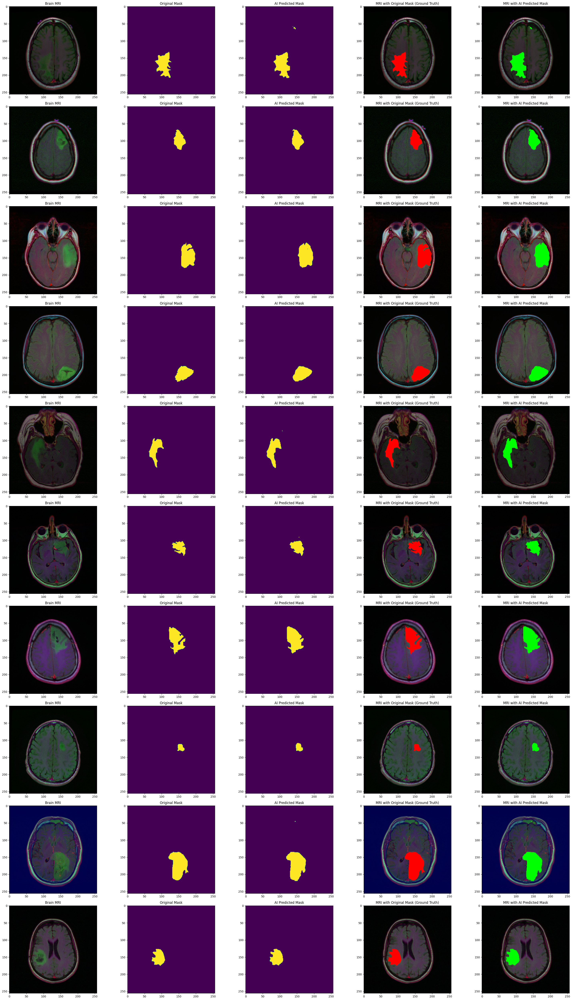

In [144]:
df_sampled = df_pred[df_pred['has_mask'] == 1].sample(n=10)

count = 0 
fig, axs = plt.subplots(10, 5, figsize=(30, 50))
for index, row in df_sampled.iterrows():
    # read the images and convert them to RGB format
    img = io.imread(data_path + row['image_path'])
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    axs[count][0].title.set_text("Brain MRI")
    axs[count][0].imshow(img)

    # Obtain the mask for the image 
    mask = io.imread(data_path + row['mask_path'])
    axs[count][1].title.set_text("Original Mask")
    axs[count][1].imshow(mask)

    # Obtain the predicted mask for the image 
    predicted_mask = np.asarray(row['predicted_mask'])[0].squeeze().round()
    axs[count][2].title.set_text("AI Predicted Mask")
    axs[count][2].imshow(predicted_mask)
    
    # Apply the mask to the image 'mask==255'
    img[mask == 255] = (255, 0, 0)
    axs[count][3].title.set_text("MRI with Original Mask (Ground Truth)")
    axs[count][3].imshow(img)

    img_ = io.imread(data_path + row['image_path'])
    img_ = cv2.cvtColor(img_, cv2.COLOR_BGR2RGB)
    img_[predicted_mask == 1] = (0, 255, 0)
    axs[count][4].title.set_text("MRI with AI Predicted Mask")
    axs[count][4].imshow(img_)
    count += 1

fig.tight_layout()
